In [1]:
import sys
import matplotlib.pyplot as plt
import h5py
from tqdm import tqdm
import librosa
import numpy as np
from keras.utils.np_utils import to_categorical
from sklearn.utils import shuffle
import cv2
import torch
import torchaudio

from tools import prepare, mixup, preprocess, noise, getCorrects


classes = {
    "Rhinolophus ferrumequinum": 0,
    "Rhinolophus hipposideros": 1,
    "Myotis daubentonii": 2,
    "Myotis brandtii": 3,
    "Myotis mystacinus": 4,
    "Myotis emarginatus": 5,
    "Myotis nattereri": 6,
    #"Myotis bechsteinii": 7,
    "Myotis myotis": 7,
    "Myotis dasycneme": 8,
    "Nyctalus noctula": 9,
    "Nyctalus leisleri": 10,
    "Pipistrellus pipistrellus": 11,
    "Pipistrellus nathusii": 12,
    "Pipistrellus kuhlii": 13,
    "Eptesicus serotinus": 14,
    "Eptesicus nilssonii": 15,
    #"Plecotus auritus": 16,
    #"Plecotus austriacus": 16,
    #"Barbastella barbastellus": 16,
    #"Tadarida teniotis": 16,
    "Miniopterus schreibersii": 16,
    #"Hypsugo savii": 18,
    "Vespertilio murinus": 17,
}

2022-12-31 16:32:39.589200: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-12-31 16:32:40.047691: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-12-31 16:32:42.883665: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/ffundel/.local/lib:
2022-12-31 16:32:42.883966: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cann

# Dataset

In [2]:
num_bands = 257
max_len = 60
seq_len = (max_len + 1) * 2816      # = 250ms ~ 25ms (0.5 * 44 * (512 // 4))
seq_skip = int(max_len / 4) * 2816     # 15 patches = 15 * 0.25 * 22050 * 0.5
patch_len = 44
patch_skip = 22

data_path = "../BAT/datasets/prepared_signal.h5"
X_train, Y_train, X_test, Y_test, X_val, Y_val = prepare(data_path, classes, seq_len, seq_skip)

100%|███████████████████████████████████████████| 22/22 [00:00<00:00, 23.31it/s]


In [3]:
print("Total sequences:", len(X_train) + len(X_test) + len(X_val))
print("Train sequences:", X_train.shape, Y_train.shape)
print("Test sequences:", X_test.shape, Y_test.shape)
print("Validation sequences:", X_val.shape, Y_val.shape)

Total sequences: 19194
Train sequences: (11323, 171776) (11323, 18)
Test sequences: (4980, 171776) (4980, 18)
Validation sequences: (2891, 171776) (2891, 18)


In [4]:
# Reverse holdout for unsupervised training
holdout = False
if holdout:
    h_split = 0.9
    h_train = int(len(X_train) * h_split)
    h_test = int(len(X_test) * h_split)
    h_val = int(len(X_val) * h_split)
    X_train = X_train[:h_train]
    X_test = X_test[:h_test]
    X_val = X_val[:h_val]

In [5]:
print("Total sequences:", len(X_train) + len(X_test) + len(X_val))
print("Train sequences:", X_train.shape, Y_train.shape)
print("Test sequences:", X_test.shape, Y_test.shape)
print("Validation sequences:", X_val.shape, Y_val.shape)

Total sequences: 19194
Train sequences: (11323, 171776) (11323, 18)
Test sequences: (4980, 171776) (4980, 18)
Validation sequences: (2891, 171776) (2891, 18)


# Model

In [6]:
import time
import datetime
import torch
import torch.nn as nn
import math
from torch.cuda.amp import autocast
from torch.utils.data import TensorDataset, DataLoader

from torchsummary import summary
from torchmetrics.functional import f1_score

from SAM import SAM
from ASL import AsymmetricLoss
from BigBAT_AE import BigBAT

/home/ffundel/.local/lib/python3.8/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: /home/ffundel/.local/lib/python3.8/site-packages/torchvision/image.so: undefined symbol: _ZNK3c1010TensorImpl36is_contiguous_nondefault_policy_implENS_12MemoryFormatE
  warn(f"Failed to load image Python extension: {e}")


In [7]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
if torch.cuda.device_count() > 1:
    print("Let's use", torch.cuda.device_count(), "GPUs!")
    model = nn.DataParallel(model, device_ids=[0, 1])

In [8]:
from torchsummary import summary
 
d_model = 64
nhead = 2
dim_feedforward = 32
num_layers = 2
dropout = 0.3
classifier_dropout = 0.3
num_classes = len(list(classes))

patch_embedding = nn.Sequential(
    nn.Conv2d(1, 16, kernel_size=(3, 5), stride=(2, 3), padding=3),
    nn.BatchNorm2d(16),
    nn.ReLU(),

    nn.Conv2d(16, 32, kernel_size=(3, 5), stride=(2, 3), padding=3),
    nn.BatchNorm2d(32),
    nn.ReLU(),
    nn.MaxPool2d(kernel_size=3, stride=2, padding=1),

    nn.Conv2d(32, 32, kernel_size=(3, 3), stride=(2, 3), padding=1),
    nn.BatchNorm2d(32),
    nn.ReLU(),

    nn.Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 3), padding=1),
    nn.BatchNorm2d(64),
    nn.ReLU(),

    nn.Conv2d(64, 64, kernel_size=(3, 3), stride=(2, 2), padding=1),
    nn.BatchNorm2d(64),
    nn.ReLU(),
)
        
BATencode = BigBAT(
    max_len=max_len,
    patch_len=patch_len,
    patch_skip=patch_skip,
    d_model=d_model,
    num_classes=len(list(classes)),
    patch_embedding=patch_embedding,
    nhead=nhead,
    dim_feedforward=dim_feedforward,
    num_layers=num_layers,
    dropout=dropout,
    classifier_dropout=classifier_dropout,
)
        
class EmbedPretrain(nn.Module):
    def __init__(self, encoder):
        super().__init__()
        
        self.encoder = encoder
        
        self.decode = nn.Sequential(
            nn.ConvTranspose2d(64, 64, kernel_size=(5, 5), stride=(2, 3), padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(64, 32, kernel_size=(5, 7), stride=(2, 3), padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(True),

            nn.ConvTranspose2d(32, 16, kernel_size=(3, 3), stride=(2, 3), padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(16, 8, kernel_size=(3, 3), stride=(2, 3), padding=(1, 2)),
            nn.BatchNorm2d(8),
            nn.ReLU(True),

            nn.ConvTranspose2d(8, 1, kernel_size=(2, 3), stride=(2, 3), padding=(3, 5)),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )
        
    def forward(self, x):
        #x = self.encode(x)
        # b * n, 1, w, h
        bn, _, _, _ = x.shape
        
        # masking
        #n_masks = int(0.1 * bn) # 10% masking
        #mask_ids = torch.randint(0, bn, (n_masks,))
        #x[mask_ids, :, :, :] = 0
        
        x = self.encoder(x) # b * n, d, 1, 1
        
        x = self.decode(x)
        return x

model = EmbedPretrain(BATencode).to(device)
#summary(model, (1, 44, 257))

In [9]:
batch_size = 32
epochs = 50
lr = 0.0005

In [10]:
train_data = TensorDataset(torch.Tensor(X_train), torch.from_numpy(Y_train))
test_data = TensorDataset(torch.Tensor(X_test), torch.from_numpy(Y_test))
val_data = TensorDataset(torch.Tensor(X_val), torch.from_numpy(Y_val))

train_loader = DataLoader(train_data, batch_size=batch_size)
test_loader = DataLoader(test_data, batch_size=batch_size)
val_loader = DataLoader(val_data, batch_size=batch_size)

In [11]:
#criterion = nn.L1Loss()

#optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

criterion = nn.MSELoss() # mean square error loss
optimizer = torch.optim.Adam(model.parameters(),
                             lr=lr, 
                             weight_decay=1e-5) # <--
    
#scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer=optimizer, T_0=5)
scheduler = None

min_val_loss = np.inf

torch.autograd.set_detect_anomaly(True)

In [12]:
def stitch(a, r):
    return a[::r]

def plot_sequence(X):
    plt.figure(figsize = (20, 2.5))
    x = X.cpu().detach().numpy()
    stitched = stitch(x, int(patch_len / patch_skip))
    spec = np.rot90(np.concatenate(stitched))
    plt.imshow(spec, interpolation='nearest', aspect='auto', cmap='inferno')
    plt.colorbar()

In [13]:
def train_epoch(model, epoch, criterion, optimizer, scheduler, dataloader, device):
    model.train()
    
    running_loss = 0.0
    
    num_batches = len(dataloader)
    num_samples = len(dataloader.dataset)
    
    for batch, (inputs, labels) in enumerate(tqdm(dataloader)):
        # Transfer Data to GPU if available
        inputs = inputs.to(device)
        inputs, labels = mixup(inputs, labels, num_classes, min_seq=1, max_seq=3, p_min=0.3)
        inputs = preprocess(inputs)
        
        inputs = inputs.unfold(dimension=1, size=patch_len, step=patch_skip).permute((0, 1, 3, 2)) # patches
        b, n, w, h = inputs.shape
        inputs = inputs.reshape((b * n, 1, w, h))
         
        # Clear the gradients
        optimizer.zero_grad()
        
        # Forward Pass
        outputs = model(inputs)
        outputs = outputs.reshape(inputs.shape)

        # Compute Loss
        loss = criterion(outputs, inputs)
        
        # Calculate gradients
        loss.backward()
        
        # Update Weights
        optimizer.step()
        
        # Calculate Loss
        running_loss += loss.item() * inputs.size(0)
    
        # Perform learning rate step
        #scheduler.step(epoch + batch / num_batches)
            
    epoch_loss = running_loss / num_samples
    
    return epoch_loss

In [14]:
def test_epoch(model, epoch, criterion, optimizer, dataloader, device):
    model.eval()
    
    num_batches = len(dataloader)
    num_samples = len(dataloader.dataset)
    
    with torch.no_grad():
        running_loss = 0.0

        for batch, (inputs, labels) in enumerate(tqdm(dataloader)):
            # Transfer Data to GPU if available
            inputs = inputs.to(device)
            inputs = preprocess(inputs)
            
            inputs = inputs.unfold(dimension=1, size=patch_len, step=patch_skip).permute((0, 1, 3, 2)) # patches
            b, n, w, h = inputs.shape
            inputs = inputs.reshape((b * n, 1, w, h))
            num_samples = b * n
        
            # Clear the gradients
            optimizer.zero_grad()

            # Forward Pass
            outputs = model(inputs)
            outputs = outputs.reshape(inputs.shape)

            # Compute Loss
            loss = criterion(outputs, inputs)

            # Calculate Loss
            running_loss += loss.item() * inputs.size(0)

        epoch_loss = running_loss / num_samples
    
    a = np.random.randint(0, b)
    return epoch_loss, inputs.reshape((b, n, w, h))[a], outputs.reshape((b, n, w, h))[a]

# Training

In [15]:
import wandb

wandb_config = {
    "epochs": epochs,
    "lr": lr,
    "batch_size": batch_size
}

wandb.init(project="BigBAT-pretrain", entity="frankfundel", config=wandb_config)

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: frankfundel (use `wandb login --relogin` to force relogin)
2022-12-31 16:33:45.729882: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-12-31 16:33:46.170491: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-12-31 16:33:48.338507: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory

==================== Starting at epoch 0 ====================


100%|█████████████████████████████████████████| 354/354 [02:19<00:00,  2.54it/s]

Training loss: 10.0888



100%|███████████████████████████████████████████| 91/91 [00:08<00:00, 10.92it/s]

Validation loss: 36.9435


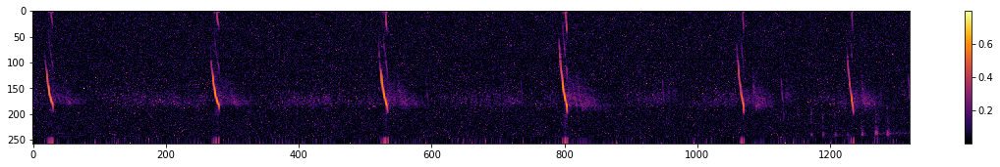

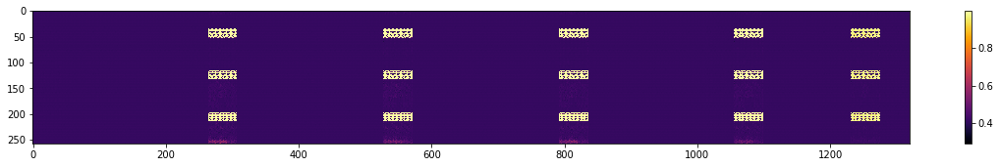

val_loss decreased, saving model
==================== Starting at epoch 1 ====================


100%|█████████████████████████████████████████| 354/354 [02:13<00:00,  2.64it/s]

Training loss: 7.8712



100%|███████████████████████████████████████████| 91/91 [00:07<00:00, 12.62it/s]

Validation loss: 29.8696


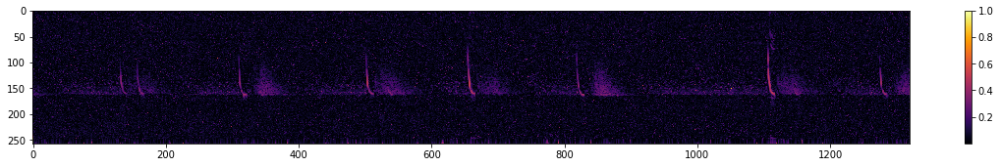

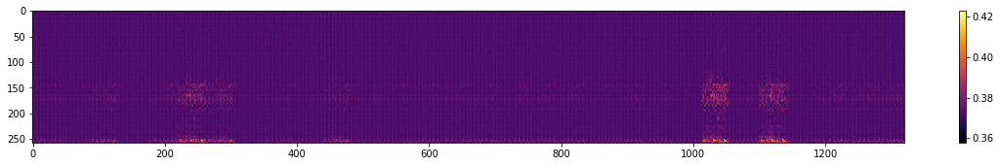

val_loss decreased, saving model
==================== Starting at epoch 2 ====================


100%|█████████████████████████████████████████| 354/354 [02:13<00:00,  2.66it/s]

Training loss: 6.3303



100%|███████████████████████████████████████████| 91/91 [00:07<00:00, 12.75it/s]

Validation loss: 23.6964


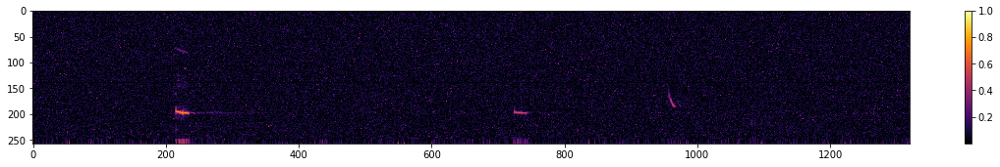

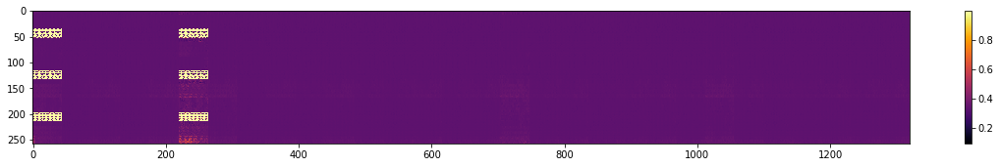

val_loss decreased, saving model
==================== Starting at epoch 3 ====================


100%|█████████████████████████████████████████| 354/354 [02:14<00:00,  2.63it/s]

Training loss: 5.1116



100%|███████████████████████████████████████████| 91/91 [00:07<00:00, 12.55it/s]

Validation loss: 19.6990


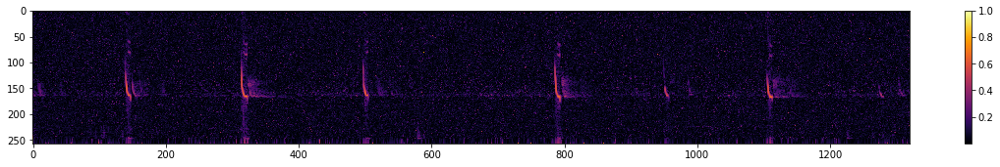

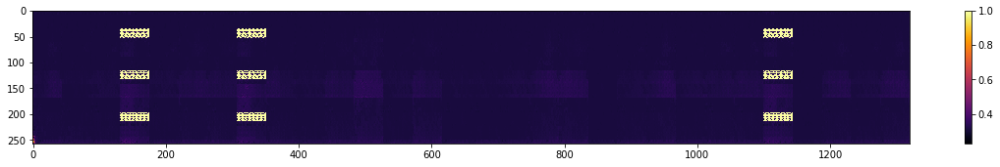

val_loss decreased, saving model
==================== Starting at epoch 4 ====================


100%|█████████████████████████████████████████| 354/354 [02:13<00:00,  2.65it/s]

Training loss: 4.1458



100%|███████████████████████████████████████████| 91/91 [00:07<00:00, 12.77it/s]

Validation loss: 15.5810


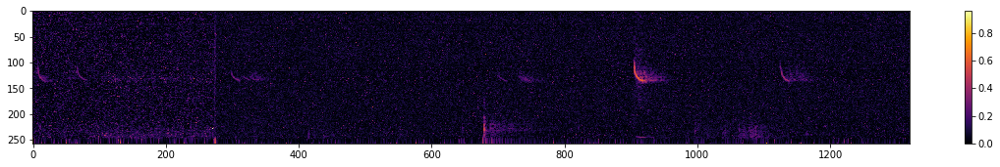

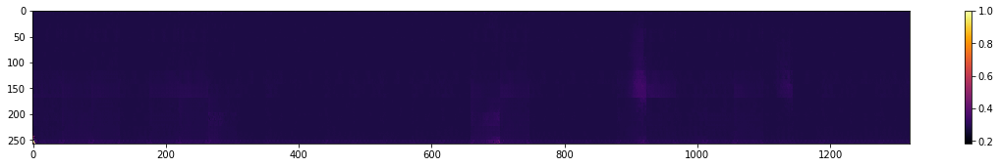

val_loss decreased, saving model
==================== Starting at epoch 5 ====================


100%|█████████████████████████████████████████| 354/354 [02:14<00:00,  2.64it/s]

Training loss: 3.3794



100%|███████████████████████████████████████████| 91/91 [00:07<00:00, 12.63it/s]

Validation loss: 12.8988


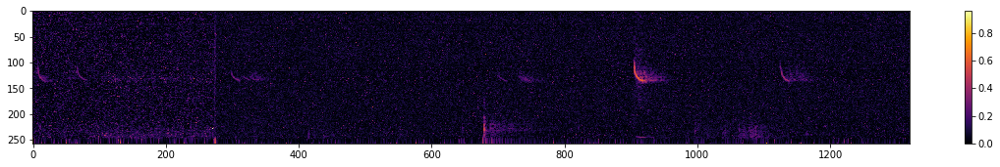

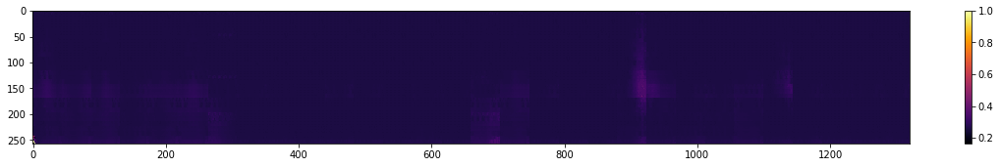

val_loss decreased, saving model
==================== Starting at epoch 6 ====================


100%|█████████████████████████████████████████| 354/354 [02:15<00:00,  2.61it/s]

Training loss: 2.7679



100%|███████████████████████████████████████████| 91/91 [00:07<00:00, 12.69it/s]

Validation loss: 10.6264


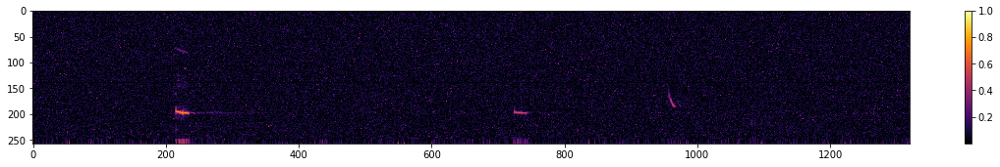

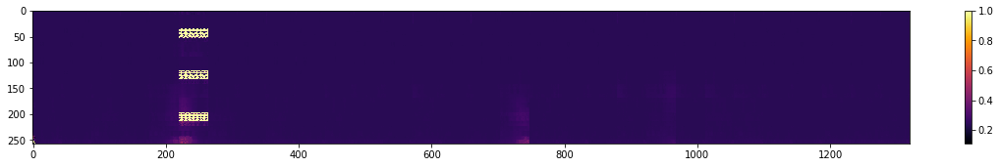

val_loss decreased, saving model
==================== Starting at epoch 7 ====================


100%|█████████████████████████████████████████| 354/354 [02:13<00:00,  2.66it/s]

Training loss: 2.2739



100%|███████████████████████████████████████████| 91/91 [00:07<00:00, 12.45it/s]

Validation loss: 8.5754


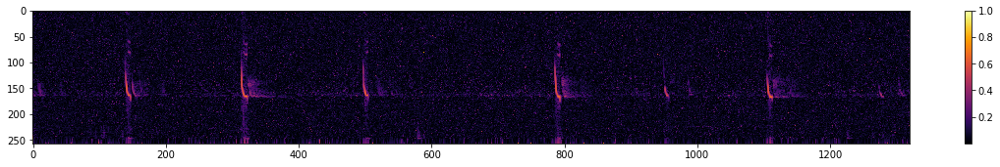

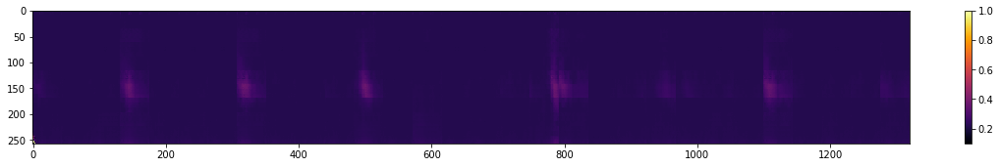

val_loss decreased, saving model
==================== Starting at epoch 8 ====================


100%|█████████████████████████████████████████| 354/354 [02:16<00:00,  2.59it/s]

Training loss: 1.8711



100%|███████████████████████████████████████████| 91/91 [00:07<00:00, 12.54it/s]

Validation loss: 7.2198


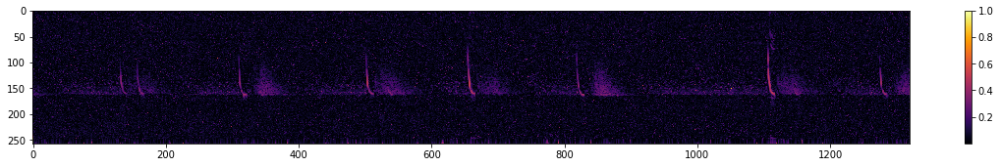

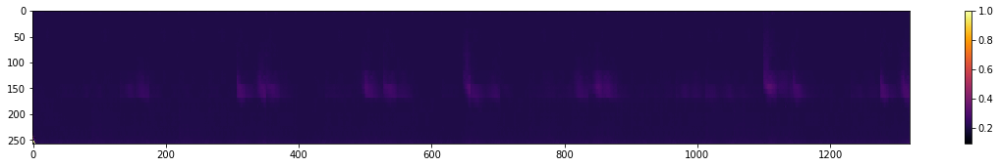

val_loss decreased, saving model
==================== Starting at epoch 9 ====================


100%|█████████████████████████████████████████| 354/354 [02:15<00:00,  2.61it/s]

Training loss: 1.5431



100%|███████████████████████████████████████████| 91/91 [00:07<00:00, 12.39it/s]

Validation loss: 5.9474


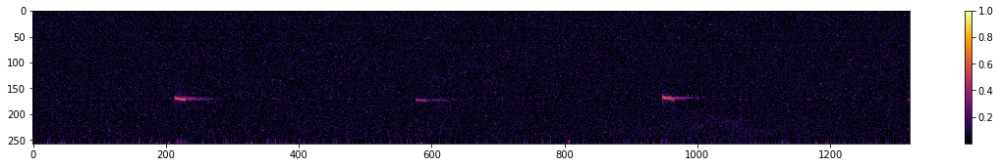

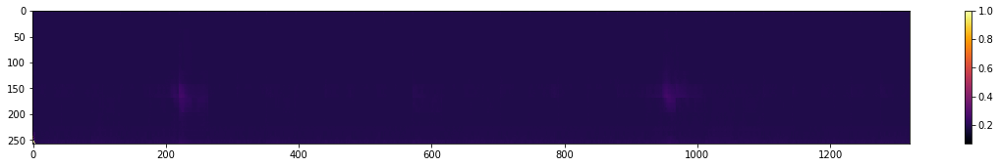

val_loss decreased, saving model
==================== Starting at epoch 10 ====================


100%|█████████████████████████████████████████| 354/354 [02:16<00:00,  2.58it/s]

Training loss: 1.2751



100%|███████████████████████████████████████████| 91/91 [00:07<00:00, 12.30it/s]

Validation loss: 4.8341


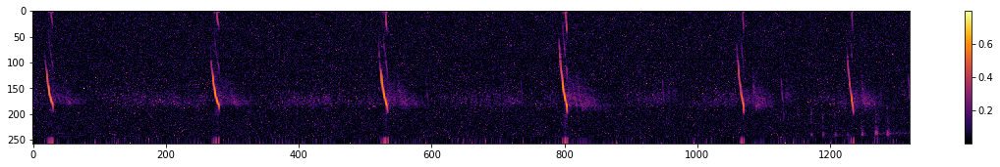

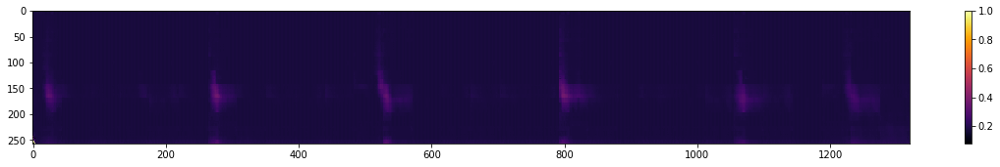

val_loss decreased, saving model
==================== Starting at epoch 11 ====================


100%|█████████████████████████████████████████| 354/354 [02:16<00:00,  2.59it/s]

Training loss: 1.0556



100%|███████████████████████████████████████████| 91/91 [00:07<00:00, 12.52it/s]

Validation loss: 3.9877


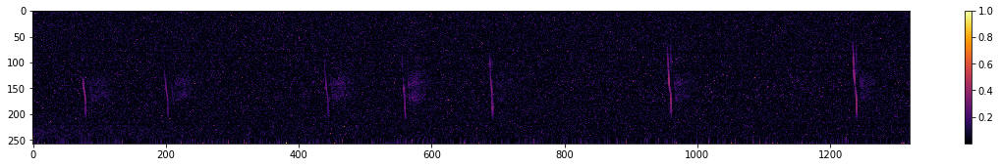

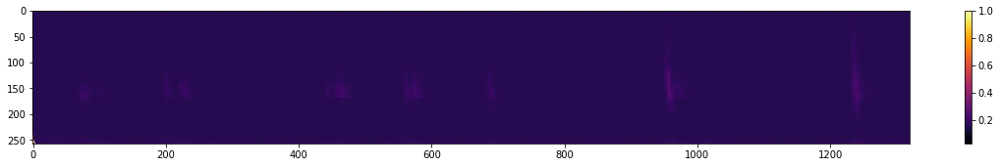

val_loss decreased, saving model
==================== Starting at epoch 12 ====================


100%|█████████████████████████████████████████| 354/354 [02:12<00:00,  2.67it/s]

Training loss: 0.8796



100%|███████████████████████████████████████████| 91/91 [00:07<00:00, 12.42it/s]

Validation loss: 3.4402


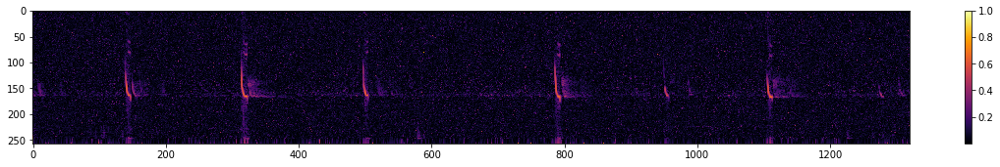

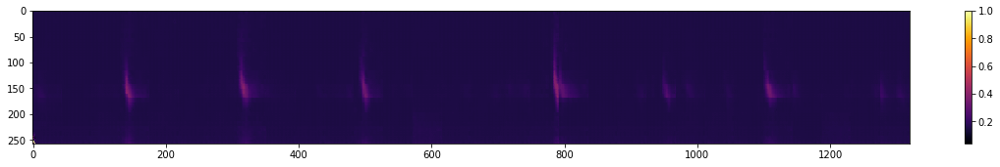

val_loss decreased, saving model
==================== Starting at epoch 13 ====================


100%|█████████████████████████████████████████| 354/354 [02:14<00:00,  2.64it/s]

Training loss: 0.7371



100%|███████████████████████████████████████████| 91/91 [00:07<00:00, 12.61it/s]


Validation loss: 2.7742


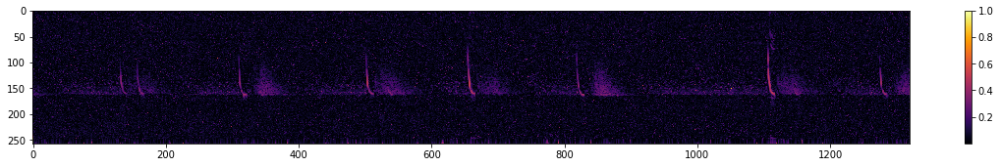

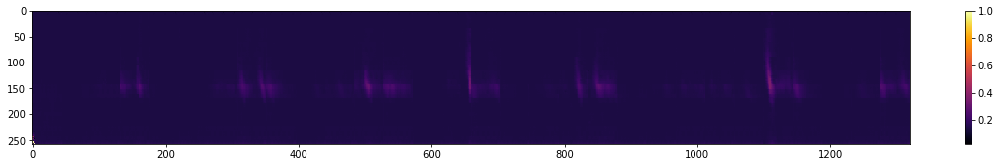

val_loss decreased, saving model
==================== Starting at epoch 14 ====================


100%|█████████████████████████████████████████| 354/354 [02:17<00:00,  2.57it/s]

Training loss: 0.6209



100%|███████████████████████████████████████████| 91/91 [00:07<00:00, 12.64it/s]


Validation loss: 2.4066


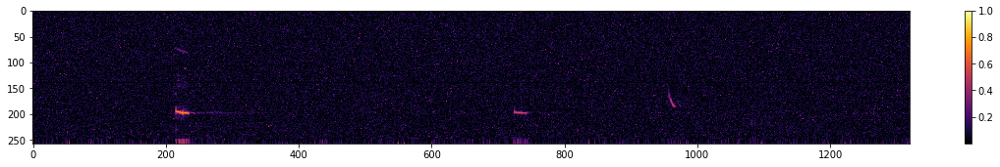

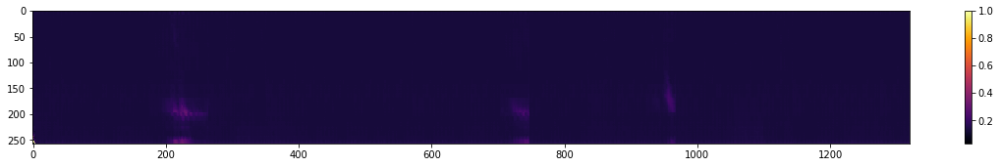

val_loss decreased, saving model
==================== Starting at epoch 15 ====================


100%|█████████████████████████████████████████| 354/354 [02:13<00:00,  2.64it/s]

Training loss: 0.5334



100%|███████████████████████████████████████████| 91/91 [00:07<00:00, 12.65it/s]

Validation loss: 2.1758


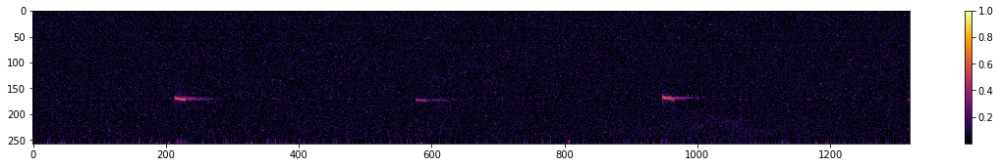

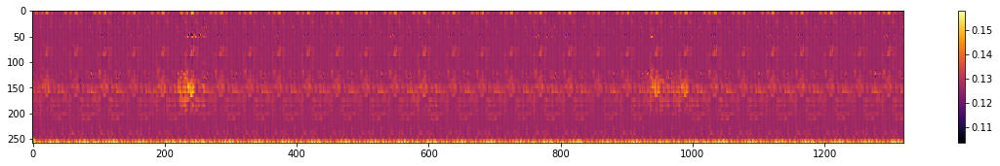

val_loss decreased, saving model
==================== Starting at epoch 16 ====================


100%|█████████████████████████████████████████| 354/354 [02:13<00:00,  2.65it/s]

Training loss: 0.4608



100%|███████████████████████████████████████████| 91/91 [00:07<00:00, 12.47it/s]

Validation loss: 1.7335


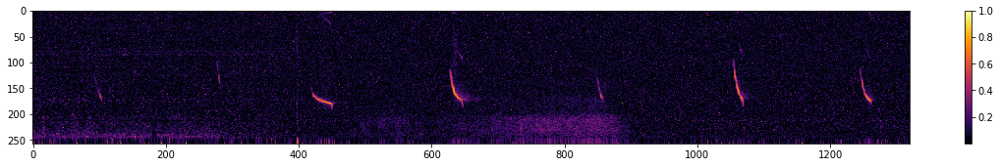

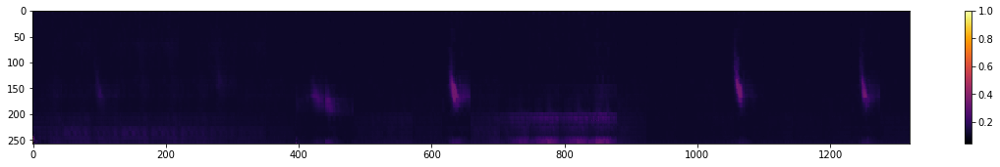

val_loss decreased, saving model
==================== Starting at epoch 17 ====================


100%|█████████████████████████████████████████| 354/354 [02:16<00:00,  2.59it/s]

Training loss: 0.3901



100%|███████████████████████████████████████████| 91/91 [00:07<00:00, 12.35it/s]

Validation loss: 1.4999


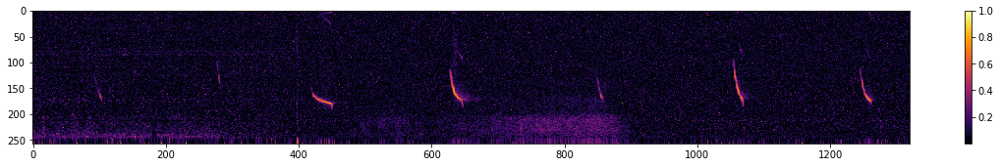

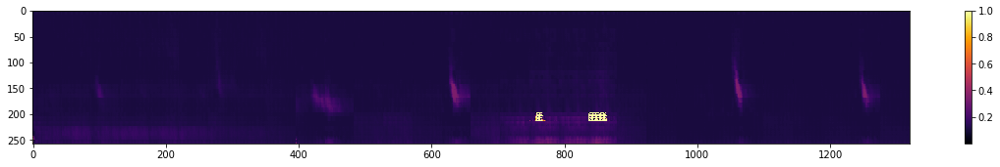

val_loss decreased, saving model
==================== Starting at epoch 18 ====================


100%|█████████████████████████████████████████| 354/354 [02:17<00:00,  2.58it/s]

Training loss: 0.3402



100%|███████████████████████████████████████████| 91/91 [00:07<00:00, 12.34it/s]

Validation loss: 1.2848


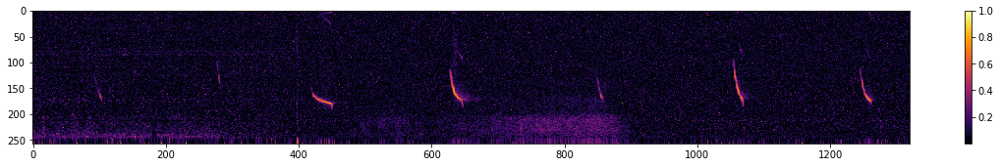

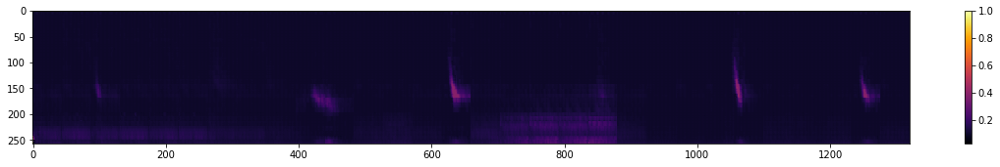

val_loss decreased, saving model
==================== Starting at epoch 19 ====================


100%|█████████████████████████████████████████| 354/354 [02:13<00:00,  2.66it/s]

Training loss: 0.3004



100%|███████████████████████████████████████████| 91/91 [00:07<00:00, 12.64it/s]

Validation loss: 1.1480


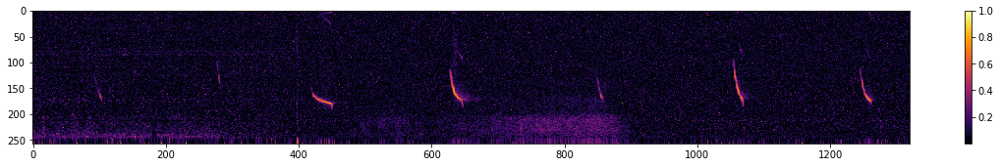

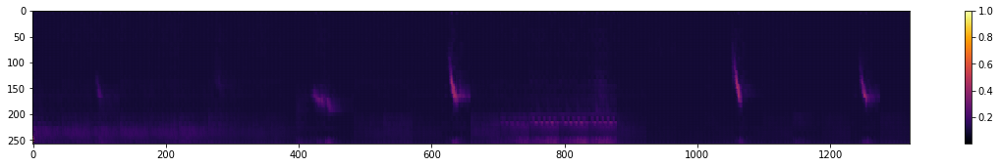

val_loss decreased, saving model
==================== Starting at epoch 20 ====================


100%|█████████████████████████████████████████| 354/354 [02:19<00:00,  2.54it/s]

Training loss: 0.2686



100%|███████████████████████████████████████████| 91/91 [00:07<00:00, 12.46it/s]


Validation loss: 1.0024


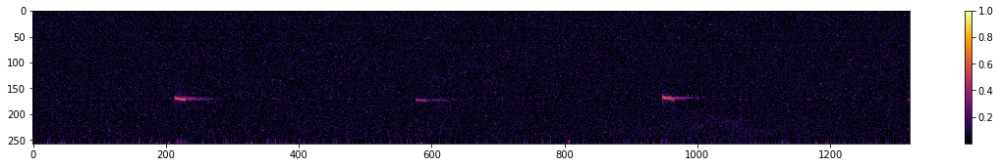

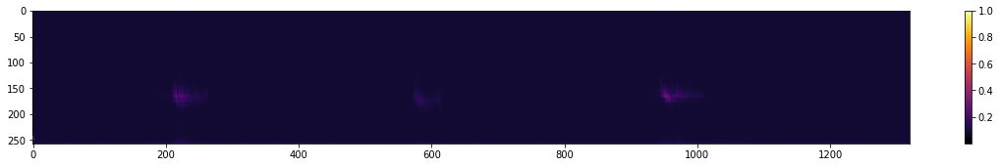

val_loss decreased, saving model
==================== Starting at epoch 21 ====================


100%|█████████████████████████████████████████| 354/354 [02:15<00:00,  2.60it/s]

Training loss: 0.2416



100%|███████████████████████████████████████████| 91/91 [00:07<00:00, 12.68it/s]

Validation loss: 0.9804


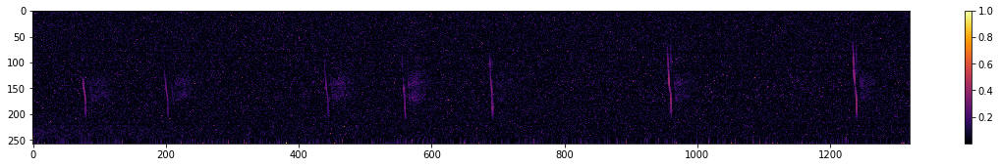

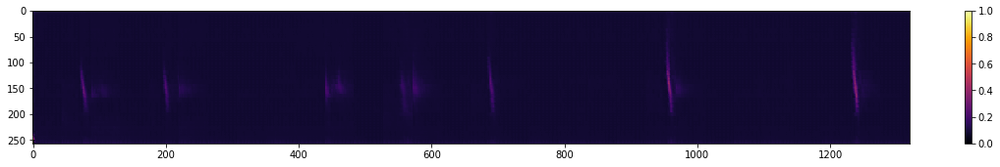

val_loss decreased, saving model
==================== Starting at epoch 22 ====================


100%|█████████████████████████████████████████| 354/354 [02:19<00:00,  2.53it/s]

Training loss: 0.2199



100%|███████████████████████████████████████████| 91/91 [00:07<00:00, 12.43it/s]

Validation loss: 0.8716


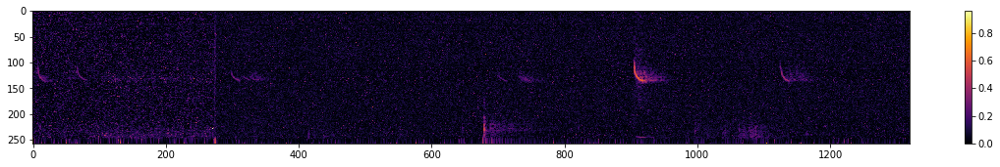

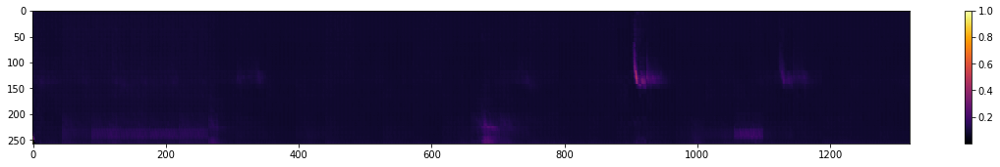

val_loss decreased, saving model
==================== Starting at epoch 23 ====================


 12%|████▉                                     | 42/354 [00:16<02:03,  2.54it/s]

In [ ]:
show_out = True

for epoch in range(epochs):
    end = time.time()
    print(f"==================== Starting at epoch {epoch} ====================", flush=True)
    
    train_loss = train_epoch(model, epoch, criterion, optimizer, scheduler, train_loader, device)
    print('Training loss: {:.4f}'.format(train_loss), flush=True)
    
    val_loss, ins, outs = test_epoch(model, epoch, criterion, optimizer, val_loader, device)
    print('Validation loss: {:.4f}'.format(val_loss), flush=True)
    
    wandb.log({
        "train_loss": train_loss,
        "val_loss": val_loss,
    })
    
    if show_out:
        plot_sequence(ins)
        plot_sequence(outs)
        plt.show()
    
    if min_val_loss > val_loss:
        print('val_loss decreased, saving model', flush=True)
        min_val_loss = val_loss
        
        # Saving State Dict
        torch.save(BATencode.state_dict(), 'BigBAT-AE.pth')

# Load after training
BATencode.load_state_dict(torch.load('BigBAT-AE.pth'))

# Evaluation